# TRABAJO EXTRA CAPÍTULO 2

En este cuaderno voy a aplicar algunos de los conocimientos que he adquirido en la primera práctica en algunas imágenes que he hecho en mi teléfono.


In [14]:
import numpy as np
from scipy import signal
import cv2
import matplotlib.pyplot as plt
import matplotlib
from ipywidgets import interactive, fixed, widgets
matplotlib.rcParams['figure.figsize'] = (15.0, 15.0)
import random

images_path = './images/'

Mi objetivo con este trabajo es utilizar 2 imágenes de contextos diferentes y hacerles varias modificaciones.

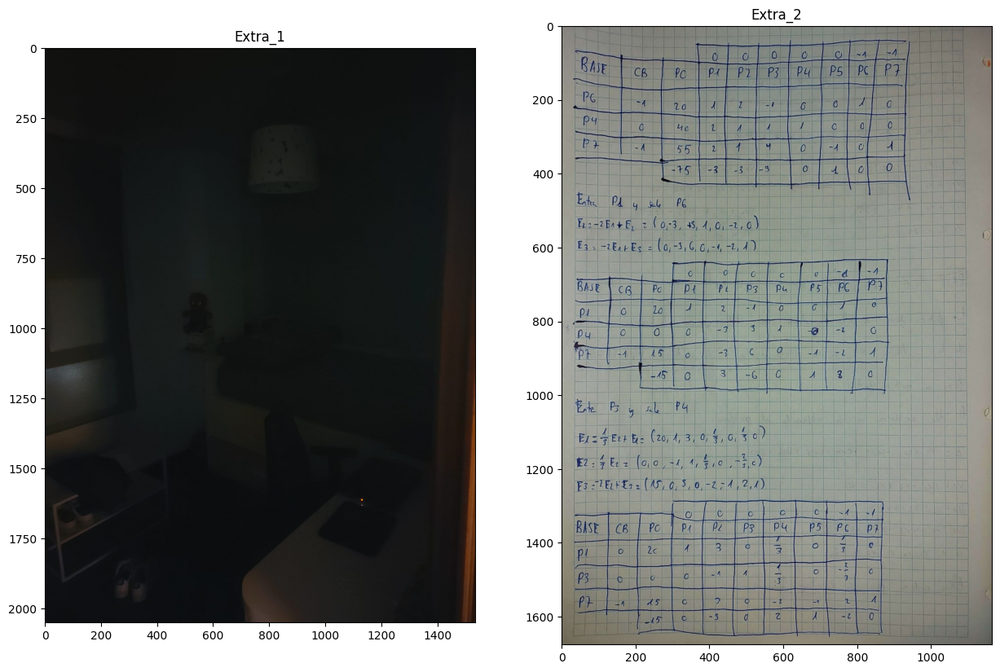

In [15]:
#Leer las 2 imágenes y mostrarlas
image_1 = cv2.imread(images_path + 'extra_1.jpeg',-1)
image_2 = cv2.imread(images_path + 'extra_2.jpeg',-1)

#Las imagenes de mi telefono estan en formato RGB, así que tengo que pasarlas a BGR
image_1 = cv2.cvtColor(image_1, cv2.COLOR_RGB2BGR)
image_2 = cv2.cvtColor(image_2, cv2.COLOR_RGB2BGR)

plt.subplot(1,2,1)
plt.title("Extra_1")
plt.imshow(image_1)

plt.subplot(1,2,2)
plt.title("Extra_2")
plt.imshow(image_2)


### **<span style="color:blue"><b><i>TRATAMIENTO PARA LA IMAGEN EXTRA_1</i></b></span>**

Vemos que la imágen está muy oscura y no se aprecia ningún elemento de la habitación correctamente. Mi objetivo es extraer su histograma
y ecualizarlo.

Para ello, voy a reutilizar la función de `equalize_chart()` que utilicé en el cuaderno 2.3

In [33]:
def equalize_chart(image, verbose=False):

    #Transform image to YCrCb color space
    image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    out_image = np.copy(image)
    
    # Apply histogram equalization to first band of the YCrCb image
    out_image[:,:,0] = cv2.equalizeHist(image[:,:,0])
    
    if verbose:

        # Plot histogram of gray image 
        plt.subplot(2,2,3)
        plt.hist(image[:,:,0].ravel(),256,[0,256])
        plt.title('Original histogram')

        # Plot equalized histogram of the processed image
        plt.subplot(2,2,4)
        plt.hist(out_image[:,:,0].ravel(),256,[0,256])
        plt.title('Equalized histogram')

        # Reconvert image to BGR
        image = cv2.cvtColor(image, cv2.COLOR_YCrCb2BGR)
        out_image = cv2.cvtColor(out_image, cv2.COLOR_YCrCb2BGR)

        # Show the initial image
        plt.subplot(2,2,1)
        plt.imshow(image)
        plt.title('Original image')

        # Show the resultant one
        plt.subplot(2,2,2)
        plt.imshow(out_image)
        plt.title('Equalized histogram image')
        
    return out_image

In [34]:
# Equalize its histogram
interactive(equalize_chart, image=fixed(image_1), verbose=fixed(True))

interactive(children=(Output(),), _dom_classes=('widget-interact',))

El resultado es bastante aceptable, pues al ecualizar la imagen hemos forzado que las intensidades oscuras se "estiren" para aprovechar todo el rango cromático.


### **<span style="color:blue"><b><i>TRATAMIENTO PARA LA IMAGEN EXTRA_2</i></b></span>**

En este caso, mi objetivo con la imagen es aumentar el contraste, separando lo máximo posible los tonos claros del fondo de la página con las escrituras de color oscuro. De esta forma, conseguiría una imágen con un texto mucho más definido y claro.

Por así decirlo, me gustaría aplicar un filtro similar al de aplicaciones como CamScanner.

Para aumentar el contraste de la imagen voy a aplicar una LUT de forma que las zonas de menor intensidad (los pixeles correspondientes al texto) sean se mantengan a 0 y las de mayor intensidad (el fondo claro del papel) sean completamente blancos. Es decir, voy a binarizarla mediante una LUT

In [56]:
def lut_appliance(image, offset, module):
    """ Genera una LUT con el offset y la pendiente de entrada y se lo aplica a la imagen  
        Args:
            image: Imagen de entrada
            offset: Rango de valores de x que tendrán valor 0
            module: pendiente de la recta.
    """

    #Create the LUT
    lut = np.arange(0,256,1)
    lut = np.clip((lut-offset)*module, 0, 255)

    image = cv2.cvtColor(image,cv2.COLOR_BGR2YCrCb)
    out_image = np.copy(image)

    # Apply LUT
    out_image[:,:,0]= cv2.LUT(image[:,:,0],lut)

    # Plot the used LUT
    plt.subplot(2,2,3)
    plt.title('LUT')
    plt.plot(np.arange(256),lut)

    # And finally, the resultant histogram
    plt.subplot(2, 2, 4)
    plt.hist(out_image[:,:,0].ravel(),256,[0,256])
    plt.title('Histograma')
    plt.show()
    
    image = cv2.cvtColor(image, cv2.COLOR_YCrCb2BGR)
    out_image = cv2.cvtColor(out_image, cv2.COLOR_YCrCb2BGR)

    # Show the initial image  
    plt.subplot(2, 2, 1)
    plt.imshow(image)
    plt.title('Imagen original')
    
    # Show the resultant one
    plt.subplot(2, 2, 2)
    plt.imshow(out_image)
    plt.title('LUT aplicada')

    plt.show()

Una vez definida la función, probamos el resultado al variar los parámetros que definen la LUT.

In [57]:
# Create widget object
offset_widget = widgets.IntSlider(value=50, min=0, max=100, step=1, description='Offset:')
module_widget = widgets.FloatSlider(value=0, min=0, max=5, step=0.25, description='Module:')

#Interact with your code!
interactive(lut_appliance, image=fixed(image_2), offset=offset_widget, module=module_widget)

interactive(children=(IntSlider(value=50, description='Offset:'), FloatSlider(value=0.0, description='Module:'…

Vemos que con un offset de 60 y 5 de pendiente el resultado es bastante aceptable, ya que el texto de la imagen es más legible que en la foto original.
He decidido usar el formato de imagen YCrCb, ya que de esta forma puedo aplicarle la LUT a la imagen en escala de grises y luego reconvertirla a su formato BGR. De esta forma, mantengo los colores originales de la imagen, por eso el texto se sigue viendo azul.


Hasta aquí mi proyecto extra de este capítulo. No es demasiado extenso, pero me ha servido para afianzar conocimientos sobre este apartado de la asignatura.